Yuran Zhang (yuranz5)

In [1]:
import pandas as pd

# EDA

# Load and Inspect the Data

In [2]:
crime_df = pd.read_csv('Crime_Data_from_2020_to_Present.csv')
crime_df.head()

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,...,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON
0,190326475,03/01/2020 12:00:00 AM,03/01/2020 12:00:00 AM,2130,7,Wilshire,784,1,510,VEHICLE - STOLEN,...,AA,Adult Arrest,510.0,998.0,NaN,NaN,1900 S LONGWOOD AV,NaN,34.0375,-118.3506
1,200106753,02/09/2020 12:00:00 AM,02/08/2020 12:00:00 AM,1800,1,Central,182,1,330,BURGLARY FROM VEHICLE,...,IC,Invest Cont,330.0,998.0,NaN,NaN,1000 S FLOWER ST,NaN,34.0444,-118.2628
2,200320258,11/11/2020 12:00:00 AM,11/04/2020 12:00:00 AM,1700,3,Southwest,356,1,480,BIKE - STOLEN,...,IC,Invest Cont,480.0,NaN,NaN,NaN,1400 W 37TH ST,NaN,34.0210,-118.3002
3,200907217,05/10/2023 12:00:00 AM,03/10/2020 12:00:00 AM,2037,9,Van Nuys,964,1,343,SHOPLIFTING-GRAND THEFT ($950.01 & OVER),...,IC,Invest Cont,343.0,NaN,NaN,NaN,14000 RIVERSIDE DR,NaN,34.1576,-118.4387
4,200412582,09/09/2020 12:00:00 AM,09/09/2020 12:00:00 AM,630,4,Hollenbeck,413,1,510,VEHICLE - STOLEN,...,IC,Invest Cont,510.0,NaN,NaN,NaN,200 E AVENUE 28,NaN,34.0820,-118.2130


DR_NO: Case number   
Date Rptd: Date reported (the date when the crime event was reported)   
DATE OCC: Date of occurrence (the actual date when the crime took place)   
TIME OCC: Time of occurrence (usually in 24-hour format, e.g., 1345 means 13:45)   
AREA: Police district number   
AREA NAME: Police district name (the specific name of the area corresponding to AREA)   
Rpt Dist No: Reporting district number (possibly a smaller district division)   
Part 1-2: Crime classification (possibly referring to the FBI Uniform Crime Reporting (UCR) Part 1 or Part 2 classification, with Part 1 typically referring to more serious crimes)   
Crm Cd: Crime code (specific code for the type of crime)   
Crm Cd Desc: Crime description (detailed description corresponding to the crime code)   
Mocodes: Modus Operandi codes (MO, indicating the suspect's method of operation)   
Vict Age: Victim's age   
Vict Sex: Victim's sex (M: Male, F: Female, X: Unknown)   
Vict Descent: Victim's descent (possibly using abbreviations like H: Hispanic, W: White, B: Black, A: Asian, etc.)   
Premis Cd: Crime location code (possibly used to describe if it was a residential area, store, public place, etc.)   
Premis Desc: Crime location description (e.g., "restaurant," "street," etc.)   
Weapon Used Cd: Weapon used code (if a weapon was involved in the crime)   
Weapon Desc: Weapon description (e.g., "handgun," "knife," etc.)   
Status: Case status (possibly indicating case progress, such as "IC" for under investigation, "AO" for apprehended suspect, etc.)   
Status Desc: Case status description (detailed explanation corresponding to the status)   
Crm Cd 1, Crm Cd 2, Crm Cd 3, Crm Cd 4: Additional crime codes (if the case involves multiple offenses)   
LOCATION: Specific location where the crime occurred   
Cross Street: Cross street near the crime location   
LAT: Latitude (for geographical location)   
LON: Longitude (for geographical location)   

In [3]:
crime_df.dtypes

DR_NO               int64
Date Rptd          object
DATE OCC           object
TIME OCC            int64
AREA                int64
AREA NAME          object
Rpt Dist No         int64
Part 1-2            int64
Crm Cd              int64
Crm Cd Desc        object
Mocodes            object
Vict Age            int64
Vict Sex           object
Vict Descent       object
Premis Cd         float64
Premis Desc        object
Weapon Used Cd    float64
Weapon Desc        object
Status             object
Status Desc        object
Crm Cd 1          float64
Crm Cd 2          float64
Crm Cd 3          float64
Crm Cd 4          float64
LOCATION           object
Cross Street       object
LAT               float64
LON               float64
dtype: object

In [4]:
crime_df.shape

(1005104, 28)

In [5]:
crime_df.isnull().sum()

DR_NO                   0
Date Rptd               0
DATE OCC                0
TIME OCC                0
AREA                    0
AREA NAME               0
Rpt Dist No             0
Part 1-2                0
Crm Cd                  0
Crm Cd Desc             0
Mocodes            151724
Vict Age                0
Vict Sex           144751
Vict Descent       144763
Premis Cd              16
Premis Desc           588
Weapon Used Cd     677860
Weapon Desc        677860
Status                  1
Status Desc             0
Crm Cd 1               11
Crm Cd 2           935958
Crm Cd 3          1002789
Crm Cd 4          1005040
LOCATION                0
Cross Street       850867
LAT                     0
LON                     0
dtype: int64

In [6]:
crime_df[['Vict Age', 'TIME OCC', 'LAT', 'LON']].describe()

,Vict Age,TIME OCC,LAT,LON
count,1.005104e+06,1.005104e+06,1.005104e+06,1.005104e+06
mean,2.891422e+01,1.339912e+03,3.399820e+01,-1.180909e+02
std,2.199366e+01,6.510650e+02,1.610623e+00,5.582072e+00
min,-4.000000e+00,1.000000e+00,0.000000e+00,-1.186676e+02
25%,0.000000e+00,9.000000e+02,3.401470e+01,-1.184305e+02
50%,3.000000e+01,1.420000e+03,3.405890e+01,-1.183225e+02
75%,4.400000e+01,1.900000e+03,3.416490e+01,-1.182739e+02
max,1.200000e+02,2.359000e+03,3.433430e+01,0.000000e+00


We can see that the 'Vict Name' column has negative values, which is unrealistic and needed to be cleaned later.

Also, Los Angeles is located within the latitude range of 33.5 to 34.5 and the longitude range of -119 to -117. However, we have identified some data points that fall outside these boundaries, which we will remove later to ensure data accuracy.

In [7]:
print(crime_df['Vict Sex'].unique())  
print(crime_df['Vict Descent'].unique())  

['M' 'X' nan 'F' 'H' '-']
['O' 'X' nan 'W' 'H' 'B' 'A' 'K' 'C' 'F' 'Z' 'V' 'I' 'P' 'J' 'G' 'U' 'D'
 'S' 'L' '-']


In the 'Vict Sex' and 'Vict Descent' columns, 'X', NaN, and '-' have the same meaning, and they need to be transformed later.

# Data Cleaning

### Convert Date and Time Columns

In [8]:
crime_df["DATE OCC"] = pd.to_datetime(crime_df["DATE OCC"], format='%m/%d/%Y %I:%M:%S %p')
crime_df["Date Rptd"] = pd.to_datetime(crime_df["Date Rptd"], format='%m/%d/%Y %I:%M:%S %p')

In [9]:
# Extract useful time features
crime_df["Year"] = crime_df["DATE OCC"].dt.year
crime_df["Month"] = crime_df["DATE OCC"].dt.month
crime_df["Quarter"] = crime_df["DATE OCC"].dt.quarter
crime_df["DayOfWeek"] = crime_df["DATE OCC"].dt.dayofweek  # 0 = Monday, 6 = Sunday
crime_df["Hour"] = crime_df["TIME OCC"] // 100  # Convert 1345 to 13 (hour)

### Drop the data for the year 2025 due to incompleteness

In [10]:
crime_df = crime_df[crime_df["Year"] != 2025]

### Handle Categorical Variables

In [11]:
# Check unique values to identify inconsistencies
print(crime_df["Vict Sex"].unique())
print(crime_df["Vict Descent"].unique())

['M' 'X' nan 'F' 'H' '-']
['O' 'X' nan 'W' 'H' 'B' 'A' 'K' 'C' 'F' 'Z' 'V' 'I' 'P' 'J' 'G' 'U' 'D'
 'S' 'L' '-']


In [12]:
# Standardize format (e.g., replace "X" with NaN for unknown values)
import numpy as np
crime_df["Vict Sex"] = crime_df["Vict Sex"].replace({"X": None, "-": None, np.nan: None})
crime_df["Vict Descent"] = crime_df["Vict Descent"].replace({"X": None, "-": None, np.nan: None})

### Handle Numeric Variables

In [13]:
# Remove unrealistic age values 
crime_df = crime_df[(crime_df["Vict Age"] > 0)]

In [14]:
# Remove non-LA data points
lat_min, lat_max = 33.5, 34.5  # LA latitude boundary
lon_min, lon_max = -119, -117  # LA longitude boundary

crime_df = crime_df[(crime_df['LAT'] > lat_min) & (crime_df['LAT'] < lat_max) & 
                    (crime_df['LON'] > lon_min) & (crime_df['LON'] < lon_max)]

# Data Visualization

### Crime Trend and Distribution

#### Crime Trend Over Time

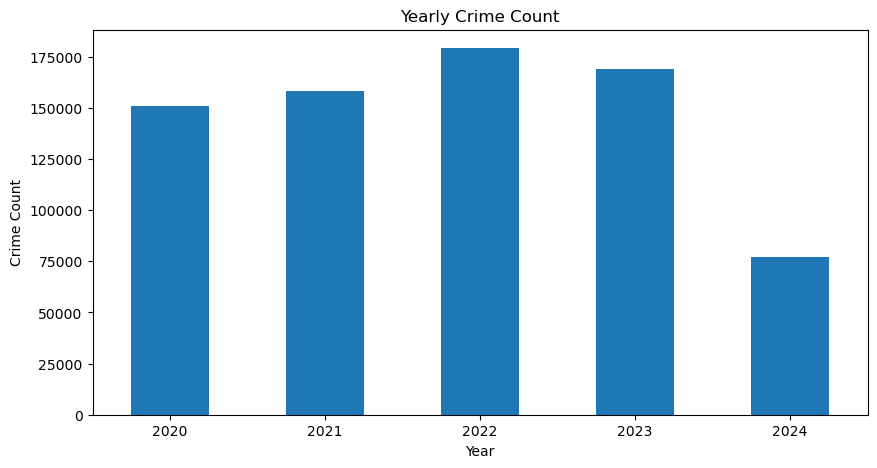

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns

# Count crimes per year
plt.figure(figsize=(10, 5))
crime_df["Year"].value_counts().sort_index().plot(kind="bar")
plt.title("Yearly Crime Count")
plt.xlabel("Year")
plt.ylabel("Crime Count")
plt.xticks(rotation=0)  # Horizontal x-axis labels (0 degree rotation)
plt.show()

There is no clear pattern between the years.

#### Crime Distribution by Month, Day of the Week, and Hour

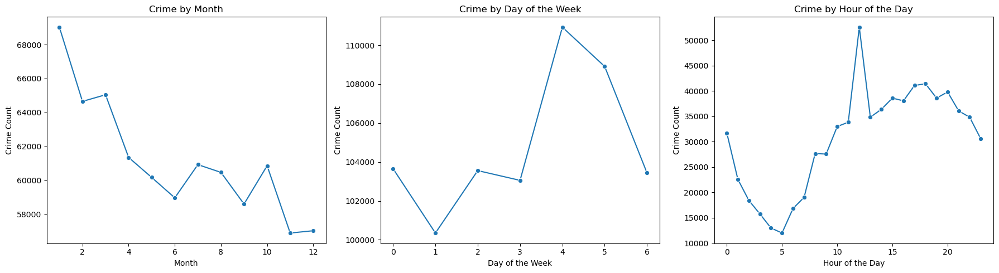

In [16]:
# Create subplots with 1 row and 3 columns
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Crime by Month
month_counts = crime_df["Month"].value_counts().sort_index()
sns.lineplot(x=month_counts.index, y=month_counts.values, marker='o', ax=axes[0])
axes[0].set_title("Crime by Month")
axes[0].set_xlabel("Month")
axes[0].set_ylabel("Crime Count")

# Crime by Day of the Week
day_counts = crime_df["DayOfWeek"].value_counts().sort_index()
sns.lineplot(x=day_counts.index, y=day_counts.values, marker='o', ax=axes[1])
axes[1].set_title("Crime by Day of the Week")
axes[1].set_xlabel("Day of the Week")
axes[1].set_ylabel("Crime Count")

# Crime by Hour
hour_counts = crime_df["Hour"].value_counts().sort_index()
sns.lineplot(x=hour_counts.index, y=hour_counts.values, marker='o', ax=axes[2])
axes[2].set_title("Crime by Hour of the Day")
axes[2].set_xlabel("Hour of the Day")
axes[2].set_ylabel("Crime Count")

# Display the plots
plt.tight_layout()
plt.show()

Clear patterns exist between the month, week, and day. We can later apply time series analysis to predict crime occurrences at specific times using a machine learning model.

### Geospatial Analysis

#### Crime Heat Map by Year

In [17]:
import folium
from folium.plugins import HeatMap

# Get unique years from the 'Year' column
years = crime_df['Year'].unique()

# Create a dictionary to store heatmaps for each year
heatmaps = {}

for year in years:
    # Filter crime data for the specific year
    yearly_crime_df = crime_df[crime_df['Year'] == year]
    
    # Create a base map centered around the average latitude and longitude of the filtered data
    map_center = [yearly_crime_df['LAT'].mean(), yearly_crime_df['LON'].mean()]
    m = folium.Map(location=map_center, zoom_start=10)
    
    # Prepare the data for the heatmap (LAT, LON coordinates)
    heat_data = list(zip(yearly_crime_df['LAT'], yearly_crime_df['LON']))
    
    # Add the heatmap to the map
    HeatMap(heat_data).add_to(m)
    
    # Store the map for each year
    heatmaps[year] = m

# Display heatmaps for each year one by one
from IPython.display import display

# Loop through the heatmaps and display them
for year in years:
    print(f"Heatmap for {year}")
    display(heatmaps[year])  # Display the heatmap for that year

Heatmap for 2020


Heatmap for 2021


Heatmap for 2022


Heatmap for 2023


Heatmap for 2024


The heatmap indicates that there are several locations with a higher concentration of crimes. We can later apply unsupervised learning (clustering) to group similar crime incidents based on their geographic location.

We can tell that the whether a crime happens is more dependent on the location than the time. So we may adjust the weights and coefficient when building the model.

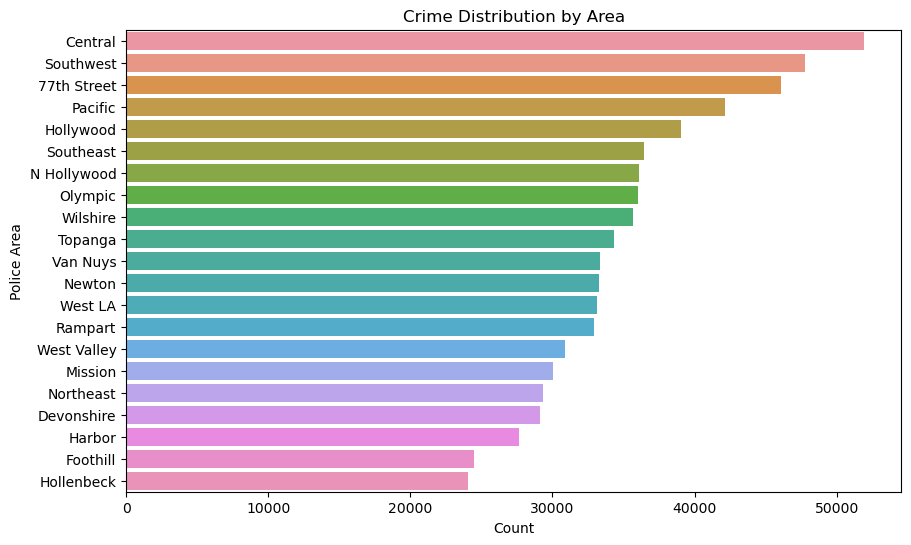

In [18]:
plt.figure(figsize=(10, 6))
sns.countplot(y=crime_df["AREA NAME"], order=crime_df["AREA NAME"].value_counts().index)
plt.xlabel("Count")
plt.ylabel("Police Area")
plt.title("Crime Distribution by Area")
plt.show()

### Crime Type

#### Check whether Crm Cd is biased

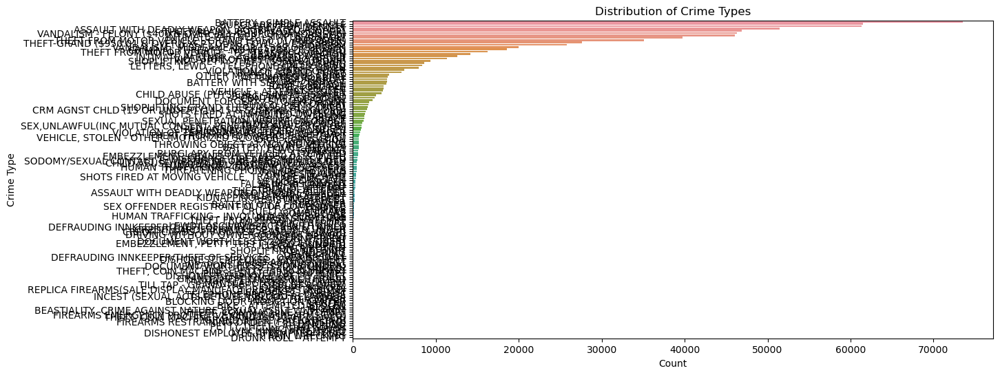

In [19]:
plt.figure(figsize=(12, 6))
sns.countplot(y=crime_df["Crm Cd Desc"], order=crime_df["Crm Cd Desc"].value_counts().index)
plt.xlabel("Count")
plt.ylabel("Crime Type")
plt.title("Distribution of Crime Types")
plt.show()

In [20]:
# Count the occurrences of each crime type
crime_counts = crime_df.groupby("Crm Cd Desc").size().reset_index(name="count")

# Sort the crime types by their counts in descending order and select the top 10
top_10_crimes = crime_counts.sort_values(by="count", ascending=False).head(10).reset_index(drop=True)

# Display the top 10 most frequent crime types
top_10_crimes

,Crm Cd Desc,count
0,BATTERY - SIMPLE ASSAULT,73532
1,BURGLARY FROM VEHICLE,61505
2,THEFT OF IDENTITY,61323
3,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",51473
4,THEFT PLAIN - PETTY ($950 & UNDER),46842
5,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",46311
6,INTIMATE PARTNER - SIMPLE ASSAULT,46037
7,BURGLARY,39756
8,THEFT FROM MOTOR VEHICLE - GRAND ($950.01 AND ...,35111
9,"THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LI...",27654


In [21]:
print("Percentage of the most common crime:", crime_counts['count'].max() / crime_counts['count'].sum())

Percentage of the most common crime: 0.10019580777862411


In [22]:
bottom_10_crimes = crime_counts.sort_values(by="count", ascending=True).head(10).reset_index(drop=True)
bottom_10_crimes

,Crm Cd Desc,count
0,TRAIN WRECKING,1
1,DISHONEST EMPLOYEE ATTEMPTED THEFT,1
2,DRUNK ROLL - ATTEMPT,1
3,LYNCHING - ATTEMPTED,1
4,PETTY THEFT - AUTO REPAIR,2
5,LYNCHING,2
6,INCITING A RIOT,2
7,FIREARMS RESTRAINING ORDER (FIREARMS RO),2
8,"THEFT, COIN MACHINE - GRAND ($950.01 & OVER)",3
9,"THEFT, COIN MACHINE - ATTEMPT",3


In [23]:
print("Percentage of the least common crime:", crime_counts['count'].min() / crime_counts['count'].sum())

Percentage of the least common crime: 1.3626150217405226e-06


The distribution of crime types in the dataset is highly imbalanced, with certain categories like **"TRAIN WRECKING"** appearing extremely rarely compared to more common offenses. This class imbalance could lead to biased model predictions, where the model favors frequent crime types while underrepresenting rare but significant crimes. To address this, we will consider techniques such as **oversampling the minority classes, undersampling the majority classes, or using class-weighted models** to ensure a more balanced learning process.

#### Most commonly used Weapon in each crime type

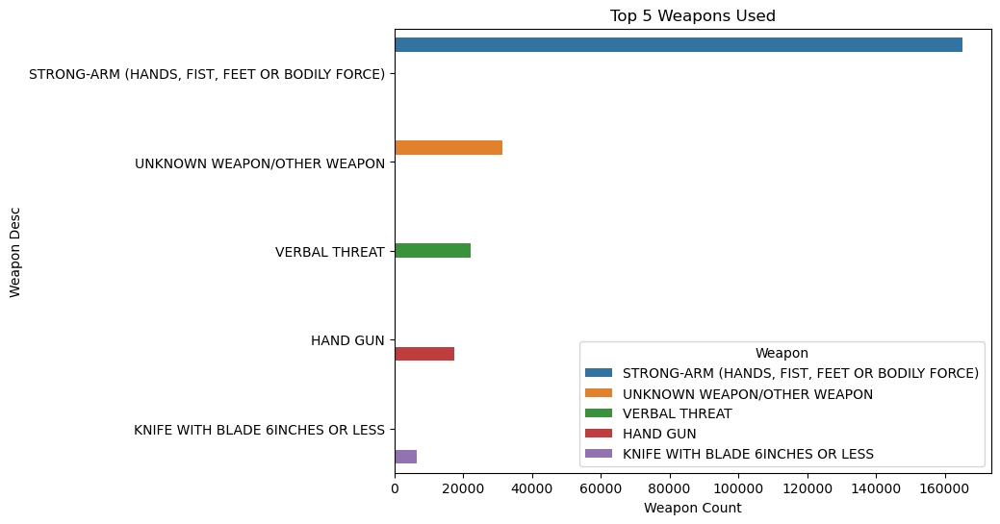

In [24]:
# Group by 'Weapon Desc', then count occurrences
crime_counts_by_weapon = crime_df.groupby("Weapon Desc").size().reset_index(name="count")

# Sort the results by 'count' in descending order and take the top 5
top_5_weapon_used = crime_counts_by_weapon.sort_values(by="count", ascending=False).head(5)

# Create a single bar chart showing the top 5 weapons
plt.figure(figsize=(8, 6))  # Adjusted the figure size for better readability

# Barplot without 'legend' argument
sns.barplot(
    x=top_5_weapon_used["count"],
    y=top_5_weapon_used["Weapon Desc"],
    hue=top_5_weapon_used["Weapon Desc"]
)

# Customize the plot
plt.xlabel("Weapon Count")
plt.title("Top 5 Weapons Used")

# Manually control the legend
plt.legend(title='Weapon', loc='best')  # Adjust legend title and location as needed

# Show the plot
plt.show()


#### Examining Differences in Crime Categories Across Locations and Time

In [25]:
from scipy.stats import chi2_contingency

# Create a contingency table for Area and Crime Type
cross_tab_area_crime = pd.crosstab(crime_df['AREA'], crime_df['Crm Cd Desc'])

# Create a contingency table for Hour and Crime Type
cross_tab_hour_crime = pd.crosstab(crime_df['DATE OCC'], crime_df['Crm Cd Desc'])

# Apply the chi-square test to each contingency table
chi2_area, p_area, dof_area, expected_area = chi2_contingency(cross_tab_area_crime)
chi2_time, p_time, dof_time, expected_time = chi2_contingency(cross_tab_hour_crime)

# Output the test results
print(f"Chi-Square Test for Area vs Crime Type: p-value = {p_area}")
print(f"Chi-Square Test for Hour vs Crime Type: p-value = {p_time}")

Chi-Square Test for Area vs Crime Type: p-value = 0.0
Chi-Square Test for Hour vs Crime Type: p-value = 0.0


Both tests indicate significant relationships (since the p-value is much smaller than the typical 0.05 threshold for significance). This suggests that both the location and time of day have a substantial impact on the type of crime that occurs. We can use this insight to build a model that classifies crime types (e.g., the top 10 most common crimes) based on available features such as time and location.

### Victim Demographic

#### Top 3 frequent crimes in different age groups

In [26]:
# Define age bins and labels
bins = [0, 17, 30, 50, 70, float('inf')]
labels = ['0-17', '18-30', '31-50', '51-70', '71+']

# Create a new column for age groups
crime_df['Age Group'] = pd.cut(crime_df['Vict Age'], bins=bins, labels=labels, right=False)

# Count the occurrences of each crime type per age group
crime_counts = crime_df.groupby(['Age Group', 'Crm Cd Desc']).size().reset_index(name='count')

# Get top 3 crimes for each age group
crime_counts['rank'] = crime_counts.groupby('Age Group', observed=False)['count'].rank(method='first', ascending=False)

# Filter only the top 3 crimes
top_crimes = crime_counts[crime_counts['rank'] <= 3].sort_values(['Age Group', 'rank'])

# Pivot the table
top_crimes_pivot = top_crimes.pivot_table(index='Age Group', columns='rank', values='Crm Cd Desc', aggfunc=lambda x: ' '.join(x))

# Rename columns
top_crimes_pivot.columns = ['No.1', 'No.2', 'No.3']

# Display the final table
top_crimes_pivot

,No.1,No.2,No.3
Age Group,,,
0-17,BATTERY - SIMPLE ASSAULT,CHILD ABUSE (PHYSICAL) - SIMPLE ASSAULT,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT"
18-30,BATTERY - SIMPLE ASSAULT,BURGLARY FROM VEHICLE,INTIMATE PARTNER - SIMPLE ASSAULT
31-50,THEFT OF IDENTITY,BURGLARY FROM VEHICLE,BATTERY - SIMPLE ASSAULT
51-70,BATTERY - SIMPLE ASSAULT,THEFT OF IDENTITY,BURGLARY
71+,BURGLARY,THEFT OF IDENTITY,BATTERY - SIMPLE ASSAULT


#### Top 3 frequent crimes among different sex

In [27]:
# Group by 'Vict Sex' and 'Crm Cd Desc', count occurrences
crime_counts_sex = crime_df.groupby(['Vict Sex', 'Crm Cd Desc'], observed=False).size().reset_index(name='count')

# Sort by count within each 'Vict Sex' group and select the top 3 crimes
top_crimes_per_sex = (
    crime_counts_sex.sort_values(['Vict Sex', 'count'], ascending=[True, False])
    .groupby('Vict Sex')
    .head(3)
)

# Assign ranking within each gender group
top_crimes_per_sex['rank'] = top_crimes_per_sex.groupby('Vict Sex').cumcount() + 1

# Pivot the table to get No.1, No.2, No.3 columns
top_crimes_pivot_sex = top_crimes_per_sex.pivot_table(index='Vict Sex', columns='rank', values='Crm Cd Desc', 
                                                       aggfunc=lambda x: ' '.join(x), observed=False)

# Rename columns
top_crimes_pivot_sex.columns = ['No.1', 'No.2', 'No.3']

# Display the table
top_crimes_pivot_sex

,No.1,No.2,No.3
Vict Sex,,,
F,THEFT OF IDENTITY,INTIMATE PARTNER - SIMPLE ASSAULT,BATTERY - SIMPLE ASSAULT
H,BURGLARY FROM VEHICLE,THEFT OF IDENTITY,THEFT PLAIN - PETTY ($950 & UNDER)
M,BATTERY - SIMPLE ASSAULT,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",BURGLARY FROM VEHICLE


#### Top 3 frequent crimes among different Descent

In [28]:
# Group by 'Vict Descent' and 'Crm Cd Desc', count occurrences
crime_counts_descent = crime_df.groupby(['Vict Descent', 'Crm Cd Desc'], observed=False).size().reset_index(name='count')

# Sort by count within each 'Vict Descent' group and select the top 3 crimes
top_crimes_per_descent = (
    crime_counts_descent.sort_values(['Vict Descent', 'count'], ascending=[True, False])
    .groupby('Vict Descent')
    .head(3)
)

# Assign ranking within each descent group
top_crimes_per_descent['rank'] = top_crimes_per_descent.groupby('Vict Descent').cumcount() + 1

# Pivot the table to get No.1, No.2, No.3 columns
top_crimes_pivot_descent = top_crimes_per_descent.pivot_table(index='Vict Descent', columns='rank', values='Crm Cd Desc', 
                                                               aggfunc=lambda x: ' '.join(x), observed=False)

# Rename columns
top_crimes_pivot_descent.columns = ['No.1', 'No.2', 'No.3']

# Display the table
top_crimes_pivot_descent

,No.1,No.2,No.3
Vict Descent,,,
A,BURGLARY,BURGLARY FROM VEHICLE,BATTERY - SIMPLE ASSAULT
B,BATTERY - SIMPLE ASSAULT,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",THEFT OF IDENTITY
C,THEFT PLAIN - PETTY ($950 & UNDER),BURGLARY FROM VEHICLE,THEFT OF IDENTITY
D,BURGLARY FROM VEHICLE,THEFT OF IDENTITY,THEFT PLAIN - PETTY ($950 & UNDER)
F,BURGLARY FROM VEHICLE,THEFT FROM MOTOR VEHICLE - GRAND ($950.01 AND ...,THEFT OF IDENTITY
G,BURGLARY FROM VEHICLE,BATTERY - SIMPLE ASSAULT,THEFT OF IDENTITY
H,BATTERY - SIMPLE ASSAULT,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",INTIMATE PARTNER - SIMPLE ASSAULT
I,THEFT PLAIN - PETTY ($950 & UNDER),THEFT OF IDENTITY,BURGLARY FROM VEHICLE
J,BURGLARY FROM VEHICLE,THEFT FROM MOTOR VEHICLE - GRAND ($950.01 AND ...,THEFT PLAIN - PETTY ($950 & UNDER)


We can see that crime types vary across different victim demographics. This allows us to analyze the relationship between victim characteristics (age, sex, descent) and crime types to uncover hidden patterns by building a prediction model to classify victim profiles based on the crime type.

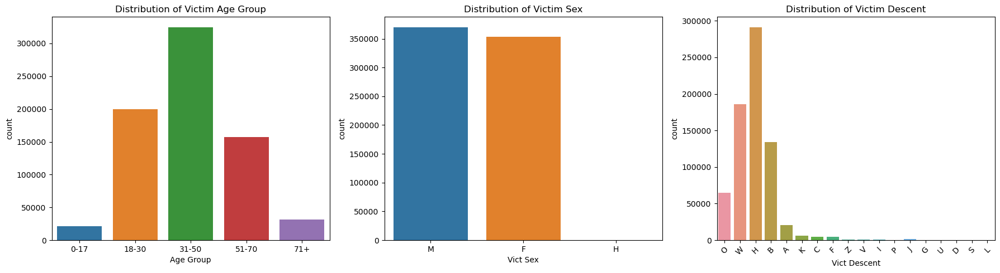

In [29]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Victim Age Group
sns.countplot(x=crime_df["Age Group"], ax=axes[0])
axes[0].set_title("Distribution of Victim Age Group")

# Victim Sex
sns.countplot(x=crime_df["Vict Sex"], ax=axes[1])
axes[1].set_title("Distribution of Victim Sex")

# Victim Descent
sns.countplot(x=crime_df["Vict Descent"], ax=axes[2])
axes[2].set_title("Distribution of Victim Descent")
axes[2].tick_params(axis='x', rotation=45)  

plt.tight_layout()
plt.show()


In [30]:
descent_distribution = vict_descent_counts.sort_values(by="count", ascending=False).reset_index(drop=True)
descent_distribution['percentage%'] = descent_distribution['count']/descent_distribution['count'].sum()*100
descent_distribution

NameError: name 'vict_descent_counts' is not defined

According to the 2023 US Census Bureau estimates, the population of Los Angeles County is as follows:

White alone: 37.3%
Black alone: 8.5%
American Indian and Alaska Native alone: 1.2%
Asian alone: 12.0%
Native Hawaiian and Other Pacific Islander alone: 0.1%
Two or More Races: 15.7%
Hispanic or Latino: 47.2%
White alone, not Hispanic or Latino: 28.3%

From the data, we can observe that the proportion of Black victims is twice as high as the actual distribution of Black people in the population, which may indicate potential bias.

In [31]:
# conduct Chi-square test to exam whether there is bias among Black people 
# Observed count for Black victims
observed_black_victims = 135491

# Total number of victims (sum of all observed victims)
total_victims = descent_distribution['count'].sum()

# Expected count for Black victims
expected_black_victims = 0.085 * total_victims # Population percentage of Black people (from the census) is 8.5%

# Perform chi-square test for Black victims
chi2_stat, p_val = chisquare([observed_black_victims, total_victims - observed_black_victims], [expected_black_victims, total_victims - expected_black_victims])

print(f"Chi-square statistic: {chi2_stat}")
print(f"P-value: {p_val}")

# Conclusion
if p_val < 0.05:
    print("There is a significant difference between the proportion of Black victims and the proportion of Black people in the population.")
else:
    print("There is no significant difference between the proportion of Black victims and the proportion of Black people in the population.")


NameError: name 'descent_distribution' is not defined

The Chi-square statistic is 58,610.87, with a p-value of 0.0, which is well below the 0.05 significance level. This indicates a statistically significant difference between the proportion of Black victims and the proportion of Black people in the population. The overrepresentation of Black victims may suggest potential bias in the data.

### Crime status

In [32]:
crime_status_table = pd.crosstab(index=crime_df['Crm Cd Desc'],
                                 columns=crime_df['Status Desc'],
                                 values=crime_df['Crm Cd Desc'],  # This will count the instances of each crime
                                 aggfunc='count')

# Display the table
crime_status_table

Status Desc,Adult Arrest,Adult Other,Invest Cont,Juv Arrest,Juv Other,UNK
Crm Cd Desc,,,,,,
ARSON,135.0,30.0,1242.0,1.0,NaN,NaN
ASSAULT WITH DEADLY WEAPON ON POLICE OFFICER,131.0,24.0,97.0,7.0,NaN,NaN
"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",11203.0,8626.0,31037.0,524.0,83.0,NaN
ATTEMPTED ROBBERY,787.0,363.0,2982.0,71.0,8.0,NaN
BATTERY - SIMPLE ASSAULT,4490.0,19264.0,48757.0,365.0,656.0,NaN
...,...,...,...,...,...,...
"VEHICLE, STOLEN - OTHER (MOTORIZED SCOOTERS, BIKES, ETC)",21.0,7.0,721.0,NaN,NaN,NaN
VIOLATION OF COURT ORDER,1119.0,2879.0,2162.0,5.0,2.0,NaN
VIOLATION OF RESTRAINING ORDER,2304.0,4507.0,4543.0,4.0,3.0,NaN


From the table, we can observe that different types of crimes have varying case processing statuses. We can train a classification model (e.g., Random Forest, Gradient Boosting) to predict the status of a crime case based on its type.

# Time series Model

I intend to use both machine learning and statistical models to predict monthly crime counts. 

# Preparing

### Data Processing

In [67]:
# Drop the redundant columns
monthly_crime_df = crime_df[['DR_NO', 'DATE OCC', 'Year','Month','Quarter']]
monthly_crime_df.head()

,DR_NO,DATE OCC,Year,Month,Quarter
1,200106753,2020-02-08,2020,2,1
2,200320258,2020-11-04,2020,11,4
3,200907217,2020-03-10,2020,3,1
11,200406391,2020-03-01,2020,3,1
19,200606074,2020-02-07,2020,2,1


In [65]:
# Group data by month to get the total crime count per month to capture both macro-level trends and short-cycle patterns.
monthly_agg_crime_df = (monthly_crime_df
    .groupby(['Year', 'Quarter', 'Month'], as_index=False)
    .agg({'DR_NO': 'count'})
    .rename(columns={'DR_NO': 'crime_count'})
)

In [66]:
monthly_agg_crime_df.head()

,Year,Quarter,Month,crime_count
0,2020,1,1,14775
1,2020,1,2,13705
2,2020,1,3,12368
3,2020,2,4,11606
4,2020,2,5,12572


### Feature Engineering

The selected features below allow the model to leverage both short-term (lag features) and seasonal/long-term patterns (month, quarter, and year) inherent in the monthly aggregated crime data. This blend of features balances capturing the immediate autocorrelation within the series and the broader seasonal and trend-related behaviors, making it a well-rounded approach for predicting monthly crime counts using a linear regression model.

In [36]:
# Here we create a copy of monthly_data for further feature engineering.
ml_df = monthly_agg_crime_df.copy()

# Create lag features: previous 1, 2, and 3 months' crime count
ml_df['lag_1'] = ml_df['crime_count'].shift(1)
ml_df['lag_2'] = ml_df['crime_count'].shift(2)
ml_df['lag_3'] = ml_df['crime_count'].shift(3)

# Remove any rows with missing values (generated by lag features)
ml_df = ml_df.dropna()
ml_df.head()

,Year,Quarter,Month,crime_count,lag_1,lag_2,lag_3
3,2020,2,4,11606,12368.0,13705.0,14775.0
4,2020,2,5,12572,11606.0,12368.0,13705.0
5,2020,2,6,12512,12572.0,11606.0,12368.0
6,2020,3,7,12778,12512.0,12572.0,11606.0
7,2020,3,8,12722,12778.0,12512.0,12572.0


In [37]:
# Split the dataset into training and testing sets
train_size = len(ml_df) - 12
train_ml = ml_df.iloc[:train_size]
test_ml  = ml_df.iloc[train_size:]

# Define the features and target variable for ML models
features = ['lag_1', 'lag_2', 'lag_3', 'Year', 'Quarter', 'Month']
target = 'crime_count'

X_train_ml = train_ml[features]
y_train_ml = train_ml[target]
X_test_ml  = test_ml[features]
y_test_ml  = test_ml[target]

# Linear Regression

The simplicity, interpretability, and efficiency make Linear Regression a valuable starting point and a useful benchmark for regression tasks like predicting monthly crime counts.

In [38]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error

In [39]:
# Initialize and train the Linear Regression model
lr_model = LinearRegression()
lr_model.fit(X_train_ml, y_train_ml)

LinearRegression()

In [40]:
# Predict the crime counts on the test set
y_pred_lr = lr_model.predict(X_test_ml)

In [41]:
# Calculate evaluation metrics
mae_lr = mean_absolute_error(y_test_ml, y_pred_lr)
rmse_lr = np.sqrt(mean_squared_error(y_test_ml, y_pred_lr))
print(f"[Linear Regression] MAE: {mae_lr:.2f}, RMSE: {rmse_lr:.2f}")

[Linear Regression] MAE: 2328.85, RMSE: 2575.32


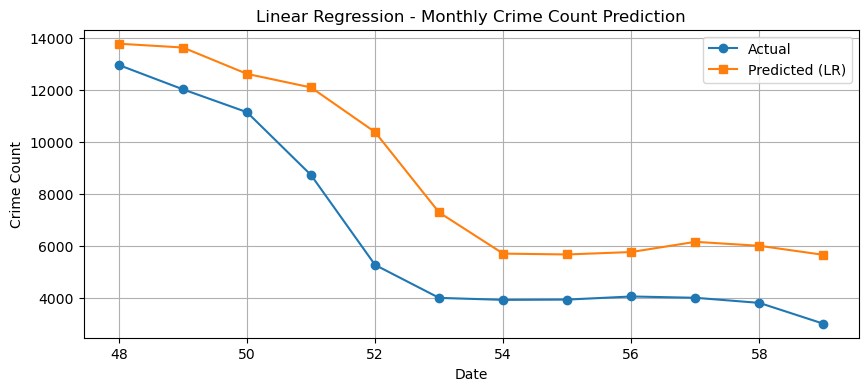

In [42]:
# Visualize the actual vs. predicted crime counts for Linear Regression
plt.figure(figsize=(10, 4))
plt.plot(test_ml.index, y_test_ml, label='Actual', marker='o')
plt.plot(test_ml.index, y_pred_lr, label='Predicted (LR)', marker='s')
plt.title("Linear Regression - Monthly Crime Count Prediction")
plt.xlabel("Date")
plt.ylabel("Crime Count")
plt.legend()
plt.grid(True)
plt.show()

# Random Forest Model

In [43]:
from sklearn.ensemble import RandomForestRegressor

In [44]:
# Initialize and train the Random Forest model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train_ml, y_train_ml)

RandomForestRegressor(random_state=42)

In [45]:
# Predict the crime counts on the test set
y_pred_rf = rf_model.predict(X_test_ml)

In [46]:
# Calculate evaluation metrics
mae_rf = mean_absolute_error(y_test_ml, y_pred_rf)
rmse_rf = np.sqrt(mean_squared_error(y_test_ml, y_pred_rf))
print(f"[Random Forest] MAE: {mae_rf:.2f}, RMSE: {rmse_rf:.2f}")

[Random Forest] MAE: 6298.00, RMSE: 7069.18


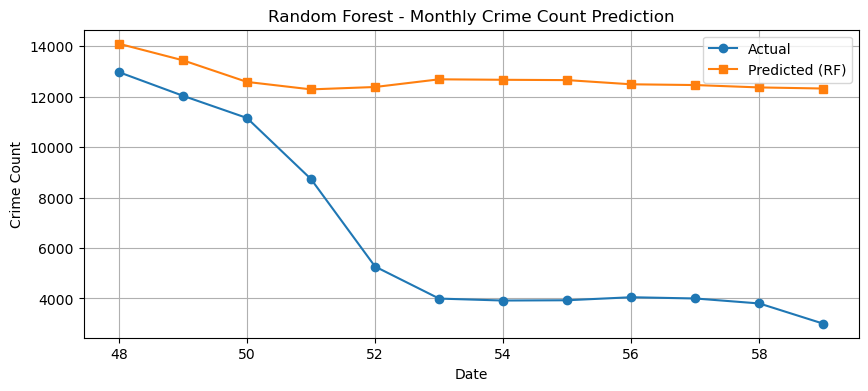

In [47]:
# Visualize the actual vs. predicted crime counts for Random Forest
plt.figure(figsize=(10, 4))
plt.plot(test_ml.index, y_test_ml, label='Actual', marker='o')
plt.plot(test_ml.index, y_pred_rf, label='Predicted (RF)', marker='s')
plt.title("Random Forest - Monthly Crime Count Prediction")
plt.xlabel("Date")
plt.ylabel("Crime Count")
plt.legend()
plt.grid(True)
plt.show()

# SARIMAX Model

In [48]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
import itertools

In [49]:
# For SARIMAX, we work directly with the original monthly_data (time series) without manual lag features.
sarimax_df = monthly_agg_crime_df.copy().dropna()

In [50]:
# Split the time series into training and testing sets (last 12 months as test)
train_sarimax = sarimax_df.iloc[:-12]
test_sarimax = sarimax_df.iloc[-12:]

In [51]:
# Parameter selection for SARIMAX
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in pdq]  # seasonal period of 12 (months)

best_aic = np.inf
best_params = None

for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            model = SARIMAX(train_sarimax['crime_count'], 
                            order=param, 
                            seasonal_order=param_seasonal,
                            enforce_stationarity=False,
                            enforce_invertibility=False)
            results = model.fit(disp=False)
            if results.aic < best_aic:
                best_aic = results.aic
                best_params = (param, param_seasonal)
        except Exception as e:
            continue

print(f"Best SARIMAX parameters: {best_params}, AIC: {best_aic}")

C:\Users\ZYR\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\ZYR\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\ZYR\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\ZYR\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to est

Best SARIMAX parameters: ((1, 1, 1), (1, 1, 1, 12)), AIC: 328.7176390808388


In [52]:
# Train the final SARIMAX model using the best parameters found
sarimax_model = SARIMAX(train_sarimax['crime_count'], 
                        order=best_params[0], 
                        seasonal_order=best_params[1],
                        enforce_stationarity=False,
                        enforce_invertibility=False)
sarimax_res = sarimax_model.fit(disp=False)
print(sarimax_res.summary())

C:\Users\ZYR\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


                                     SARIMAX Results                                      
Dep. Variable:                        crime_count   No. Observations:                   48
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 12)   Log Likelihood                -159.359
Date:                            Wed, 16 Apr 2025   AIC                            328.718
Time:                                    11:53:40   BIC                            333.940
Sample:                                         0   HQIC                           329.851
                                             - 48                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.0159      0.035    -29.191      0.000      -1.084      -0.948
ma.L1          0.9985      0.394   

In [53]:
# Forecast for the test period (last 12 months)
forecast_steps = len(test_sarimax)
sarimax_forecast = sarimax_res.get_forecast(steps=forecast_steps)
sarimax_pred = sarimax_forecast.predicted_mean
sarimax_pred.index = test_sarimax.index

In [54]:
# Evaluate SARIMAX predictions
mae_sarimax = mean_absolute_error(test_sarimax['crime_count'], sarimax_pred)
rmse_sarimax = np.sqrt(mean_squared_error(test_sarimax['crime_count'], sarimax_pred))
print(f"[SARIMAX] MAE: {mae_sarimax:.2f}, RMSE: {rmse_sarimax:.2f}")

[SARIMAX] MAE: 8307.35, RMSE: 9231.15


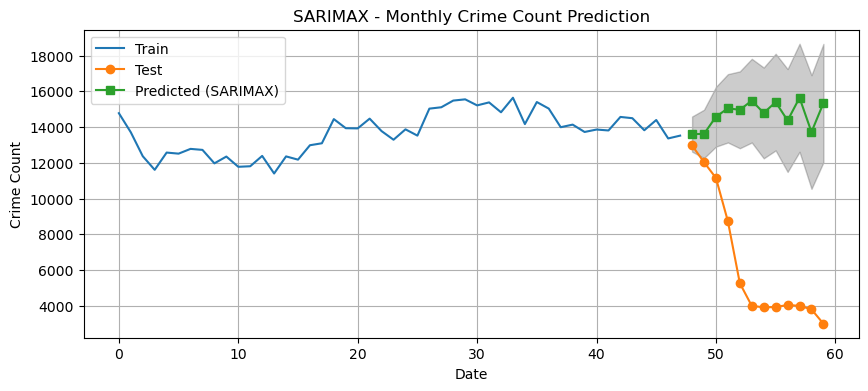

In [55]:
# Plot actual vs. predicted for SARIMAX model
plt.figure(figsize=(10, 4))
plt.plot(train_sarimax.index, train_sarimax['crime_count'], label='Train')
plt.plot(test_sarimax.index, test_sarimax['crime_count'], label='Test', marker='o')
plt.plot(sarimax_pred.index, sarimax_pred, label='Predicted (SARIMAX)', marker='s')
plt.fill_between(
    sarimax_forecast.conf_int().index,
    sarimax_forecast.conf_int().iloc[:, 0],
    sarimax_forecast.conf_int().iloc[:, 1],
    color='k', alpha=0.2
)
plt.title("SARIMAX - Monthly Crime Count Prediction")
plt.xlabel("Date")
plt.ylabel("Crime Count")
plt.legend()
plt.grid(True)
plt.show()

# Summary

For forecasting monthly crime counts on this dataset, linear regression outperforms random forest based on MAE and RMSE. This suggests that the underlying patterns in the data are better captured by a linear model, making it the preferred choice among the tested models for this specific prediction task.

Although more complex machine learning models like random forest are capable of modeling non-linear relationships, in this case, the simpler linear regression model is more effective. This may indicate that the relationship in the aggregated monthly crime data is relatively linear or that the feature engineering (e.g., lag and time features) already captures most of the predictive patterns.